G1  X10.6170000000000  Y10.6170000000000  Z15.0000000000000  F300.0000000000000
G1  X10.6170000000000  Y10.6170000000000  Z0.0000000000000  F120.0000000000000
G1  X13.0225555555556  Y10.6170000000000  Z0.0000000000000  F300.0000000000000
G1  X13.0075563012557  Y10.8568556825883  Z0.0030049491388  F300.0000000000000
G1  X12.9554474992283  Y11.0910267756037  Z0.0069474281481  F300.0000000000000
G1  X12.8677304994977  Y11.3132325315966  Z0.0118893808039  F300.0000000000000
G1  X12.7469787727814  Y11.5175405811882  Z0.0179343952359  F300.0000000000000
G1  X12.5967623779290  Y11.6985491163617  Z0.0252273862378  F300.0000000000000
G1  X12.4215416822318  Y11.8515533870016  Z0.0339523930047  F300.0000000000000
G1  X12.2265334954267  Y11.9726913611640  Z0.0443266060655  F300.0000000000000
G1  X12.0175536333888  Y12.0590640221541  Z0.0565881517508  F300.0000000000000
G1  X11.8008406622246  Y12.1088265387726  Z0.0709747974008  F300.0000000000000
G1  X11.5828661648267  Y12.1212474260839  Z0.087690

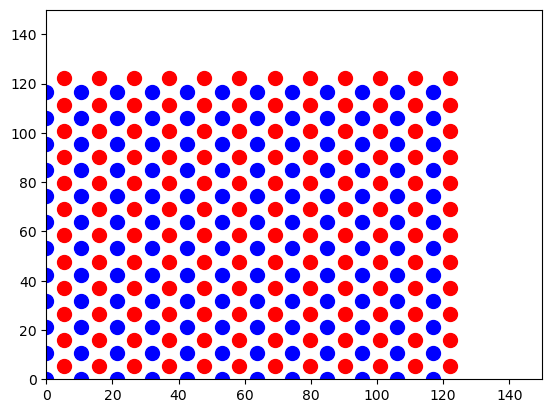

In [2]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.interpolate import CubicSpline

box_x = [0, 150, 150, 0, 0]
box_y = [0, 0, 150, 150, 0]
plt.xlim(0, 150)
plt.ylim(0, 150)
offset = 10.617
gcodeoffset = 10.617
operations = 0
'''
def randomcolor(i):
    if i%2==0:
        return 'bo'
    else:
        return 'ro'
'''    

def plot_dots_in_box(dot_coordinates):
    for x, y in dot_coordinates:
        plt.plot(x, y, 'bo', markersize = 10)
def plot_dots_in_box_interweaved(dot_coordinates):
    for x, y in dot_coordinates:
        plt.plot(x, y, 'ro', markersize = 10)

def skein(x_coord, y_coord, z_coord):
    # Parameters for the path calculation
    step = 0.1  # resolution, time step period for each xyz calculation
    k = 4
    dp = 0.08  # change to modify ER, minimum distance between fibers, center to center
    h = 0.3  # height of each layer
    c1 = 2  # standard deviation coefficient
    H = 10  # total height of the skein


    p = dp / (np.pi)
    period = (H - h) / p
    n = (k - 1) / k

    t = np.arange(0, period + step, step)

    t1 = period * np.array([0, 1/5, 2/5, 3/5, 4/5, 1])
    r1 = H * np.array([0.25, 0.4, 0.55, 0.4, 0.36, 0.25])
    pol = np.polyfit(t1, r1, 3)

    a = np.polyval(pol, t)
    c = a / c1

    theta = t
    rho = a * np.cos(n * t)

    z = h * (np.exp(- (rho**2 / (2 * c**2))))
    z = z - z[0]
    dz = p * theta
    z = z + dz
    x, y = rho * np.cos(theta), rho * np.sin(theta)

    #s = np.sum(np.sqrt(np.diff(x)**2 + np.diff(y)**2 + np.diff(z)**2))
    #er = s / H
    #print(f"Effective radius (ER): {er}")

    speed = 5 * 60  # mm/min

    motion = np.column_stack((x, y, z))
    motion[:, 0] += x_coord
    motion[:, 1] += y_coord
    motion[:, 2] += z_coord

    skeingcode = ""
    for i in range(len(motion)):
        x_str = f"X{motion[i, 0]:2.13f}"
        y_str = f"Y{motion[i, 1]:2.13f}"
        z_str = f"Z{motion[i, 2]:2.13f}"
        f_str = f"F{speed:2.13f}"
        skeingcode += f"G1  {x_str}  {y_str}  {z_str}  {f_str}\n"
    print(skeingcode)

HeightIterations = 4
VerticalIterations = 4

for h in range(HeightIterations):
    for v in range(VerticalIterations):
        operations += 1
        x = gcodeoffset+3*h*gcodeoffset
        y = gcodeoffset+3*v*gcodeoffset
        X = f"{x:.13f}"
        Y = f"{y:.13f}"
        print("G1  X" + str(X) + "  Y" + str(Y) + "  Z15.0000000000000" + "  F300.0000000000000")
        print("G1  X" + str(X) + "  Y" + str(Y) + "  Z0.0000000000000" + "  F120.0000000000000")
        print("M106S255\n")
        skein(x, y, 0)
        print("M107\n")
        print("G1  X" + str(X) + "  Y" + str(Y) + "  Z15.0000000000000" + "  F300.0000000000000")
    for v in range(VerticalIterations):
        operations += 1
        x = 1.5*gcodeoffset+3*h*gcodeoffset
        y = 1.5*gcodeoffset+3*v*gcodeoffset
        X = f"{x:.13f}"
        Y = f"{y:.13f}"
        print("G1  X" + str(X) + "  Y" + str(Y) + "  Z15.0000000000000" + "  F300.0000000000000")
        print("G1  X" + str(X) + "  Y" + str(Y) + "  Z0.0000000000000" + "  F120.0000000000000")
        print("M106S255\n")
        skein(x, y, 0)
        print("M107\n")
        print("G1  X" + str(X) + "  Y" + str(Y) + "  Z15.0000000000000" + "  F300.0000000000000")

for h in range(HeightIterations):
    for v in range(VerticalIterations):
        dot_coordinates = [
            (3*h*offset, 3*v*offset),
            (3*h*offset, 3*v*offset+offset),
            (3*h*offset, 3*v*offset+2*offset), 
            (3*h*offset+offset, 3*v*offset), 
            (3*h*offset+offset,3*v*offset+offset),
            (3*h*offset+offset, 3*v*offset+2*offset),
            (3*h*offset+2*offset, 3*v*offset), 
            (3*h*offset+2*offset, 3*v*offset+offset),
            (3*h*offset+2*offset, 3*v*offset+2*offset)]
        plot_dots_in_box(dot_coordinates)
    for v in range(VerticalIterations):
        dot_coordinates = [
            (3*h*offset+offset/2, 3*v*offset+offset/2),
            (3*h*offset+offset/2, 3*v*offset+offset+offset/2),
            (3*h*offset+offset/2, 3*v*offset+2*offset+offset/2), 
            (3*h*offset+offset+offset/2, 3*v*offset+offset/2), 
            (3*h*offset+offset+offset/2,3*v*offset+offset+offset/2),
            (3*h*offset+offset+offset/2, 3*v*offset+2*offset+offset/2),
            (3*h*offset+2*offset+offset/2, 3*v*offset+offset/2), 
            (3*h*offset+2*offset+offset/2, 3*v*offset+offset+offset/2),
            (3*h*offset+2*offset+offset/2, 3*v*offset+2*offset+offset/2)]
        plot_dots_in_box_interweaved(dot_coordinates)

print("Number of Operations: " + str(operations))
print("Number of Skeins: " + str(operations*9))
print("Estimated Print Time: " + str(operations * 3810 / 300) + " minutes")
print("Estimated Length: " + str(operations * 9 * 3.810) + " meters")
plt.show()